## Import Dependencies

In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import glob
import matplotlib.pyplot as plt
from scipy.stats import ttest_ind
from pathlib import Path
import os
from scipy.stats import norm
import numpy as np


## Trajectory Analysis

Objective: Understand the overall path taken by the fly. Plot the x and y coordinates on a 2D graph. Use color or line thickness variations to represent time progression. Identify any repetitive paths or zones of higher activity.


In [4]:

def plot_trajectory(csv_file):
    """Plots the trajectory of the fly from the given CSV file."""
    
    # Read the CSV file
    df = pd.read_csv(csv_file, names=['x', 'y', 'light'], header=None)
    
    # Ensure columns 'x', 'y', and 'light' exist in the CSV
    if all(column in df.columns for column in ['x', 'y', 'light']):
        # Plot trajectory
        plt.figure(figsize=(10, 8))
        plt.scatter(df['x'], df['y'], c=df['light'], cmap='gray', linewidth=0.5, edgecolors='red')
        plt.colorbar(label='Light (On=1, Off=0)')
        plt.title(f"Trajectory Analysis for {csv_file}")
        plt.xlabel('X position')
        plt.ylabel('Y position')
        plt.show()
    else:
        print(f"Missing necessary columns in {csv_file}. Ensure 'x', 'y', and 'light' columns exist.")




Fontconfig warning: ignoring UTF-8: not a valid region tag


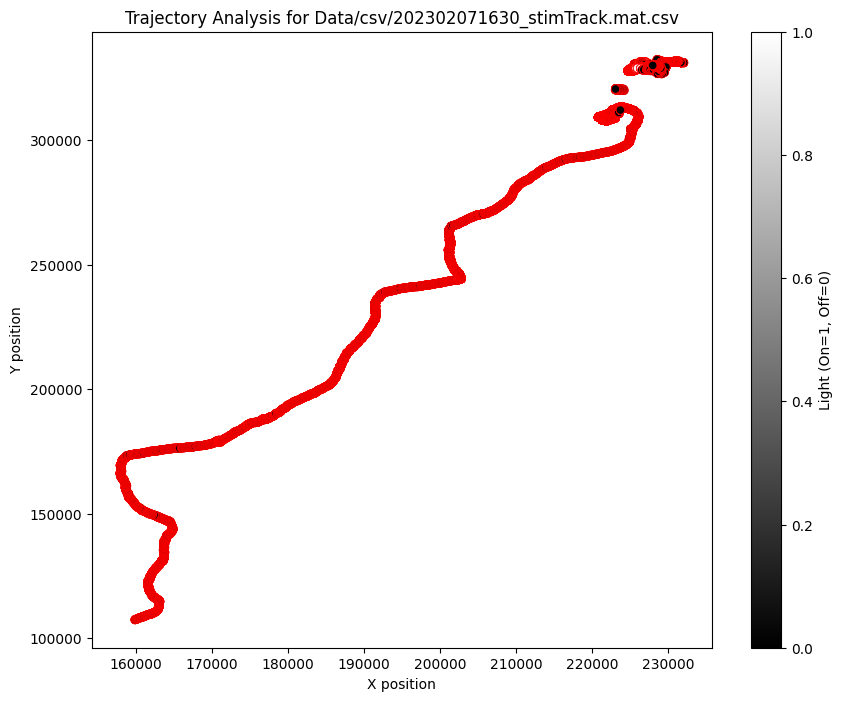

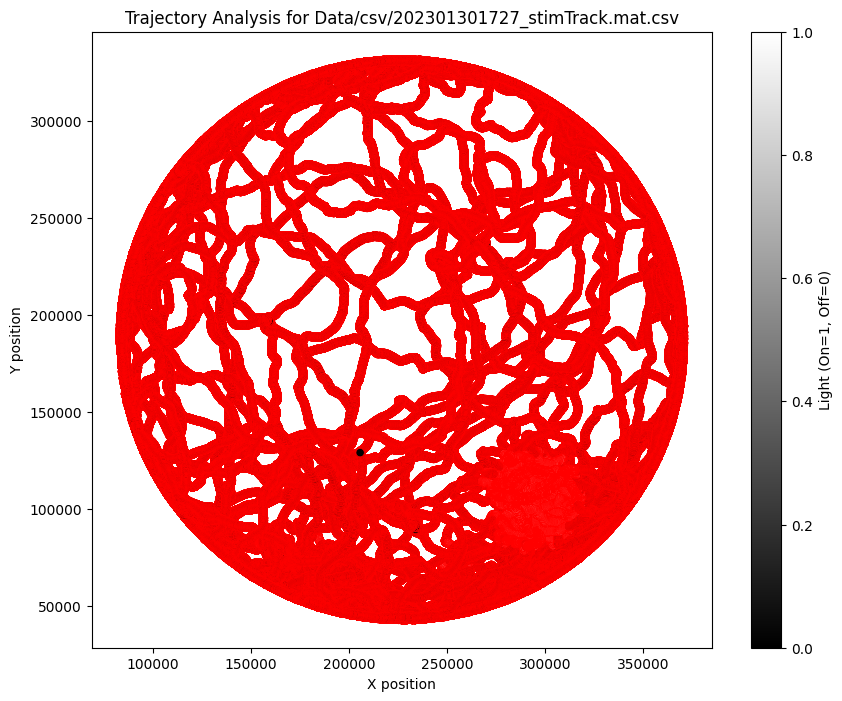

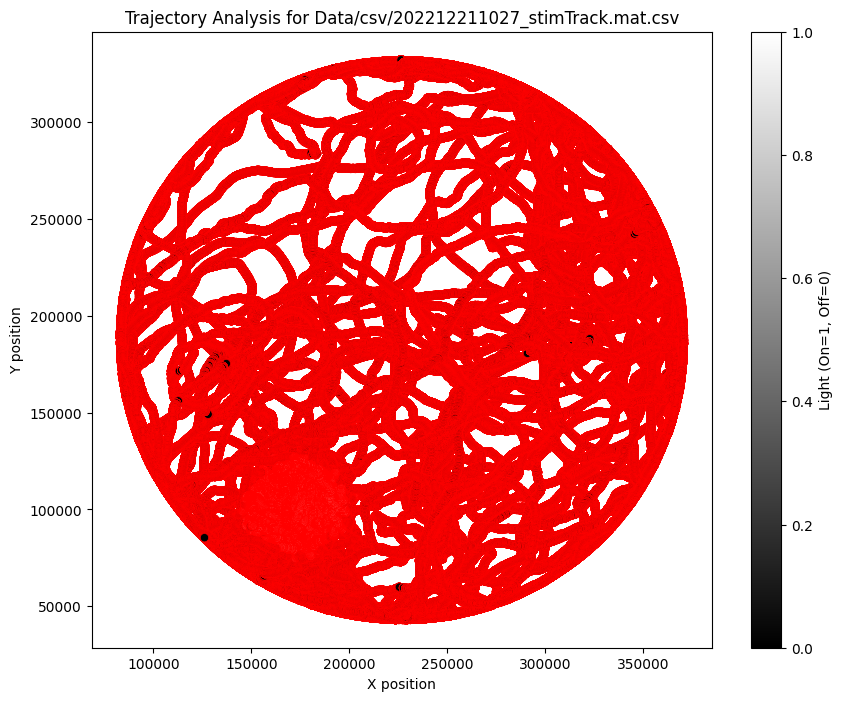

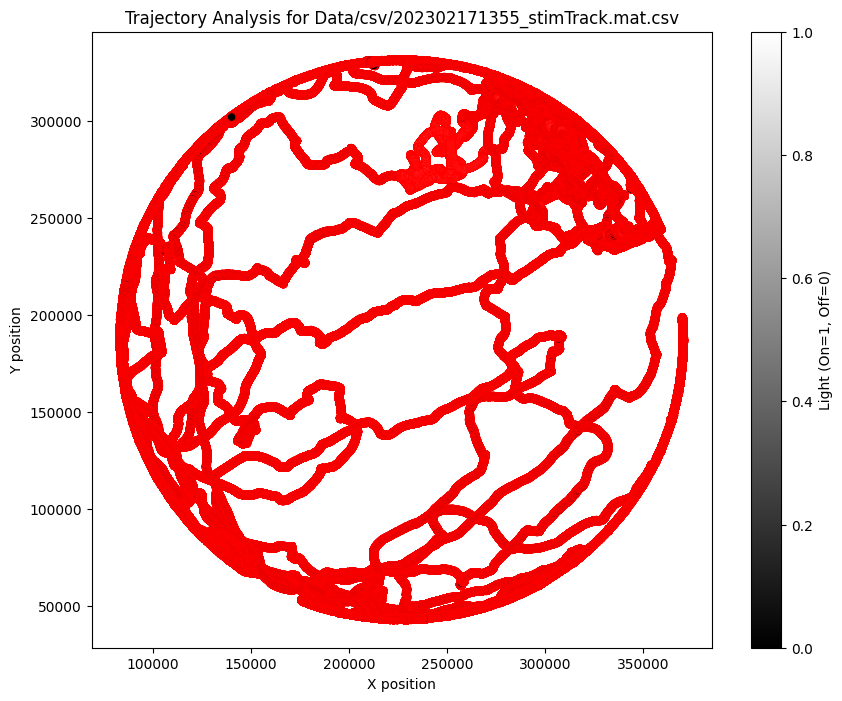

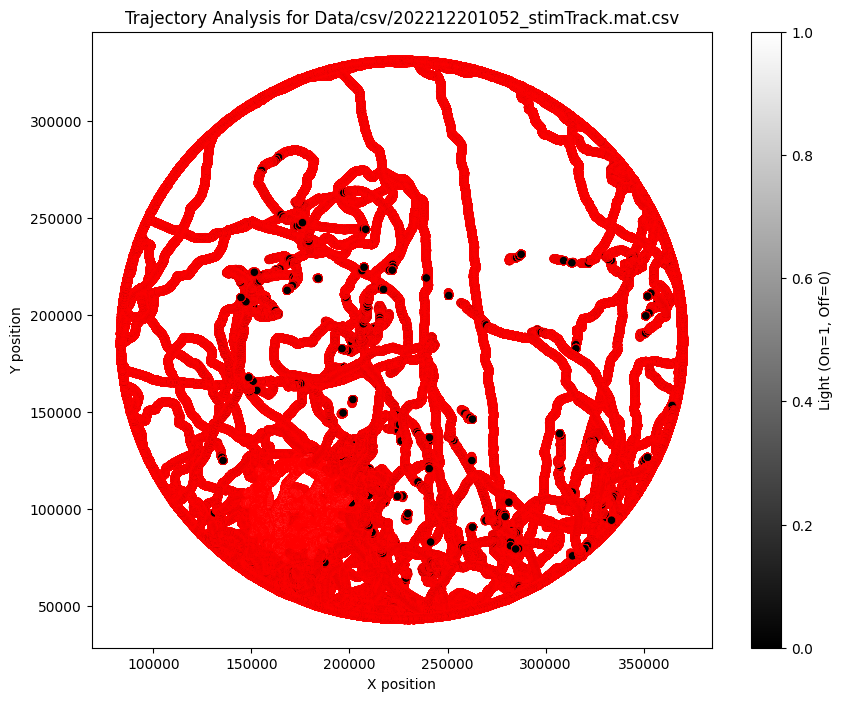

...

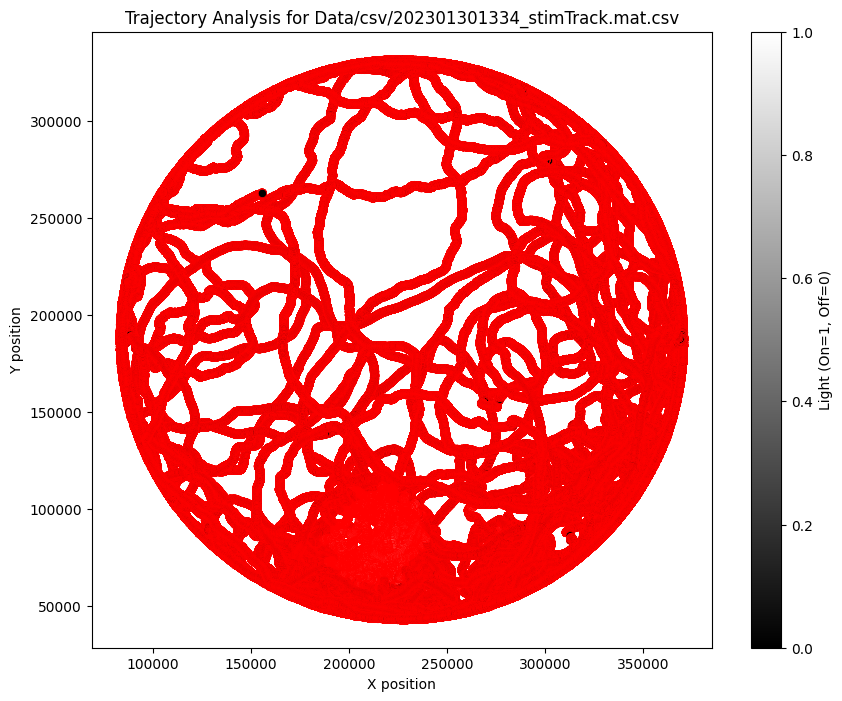

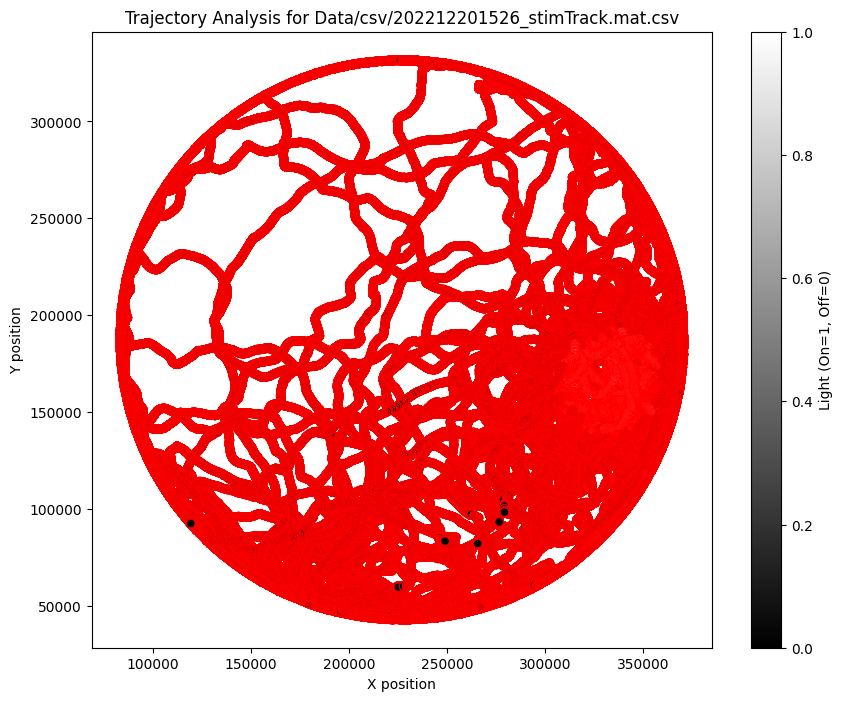

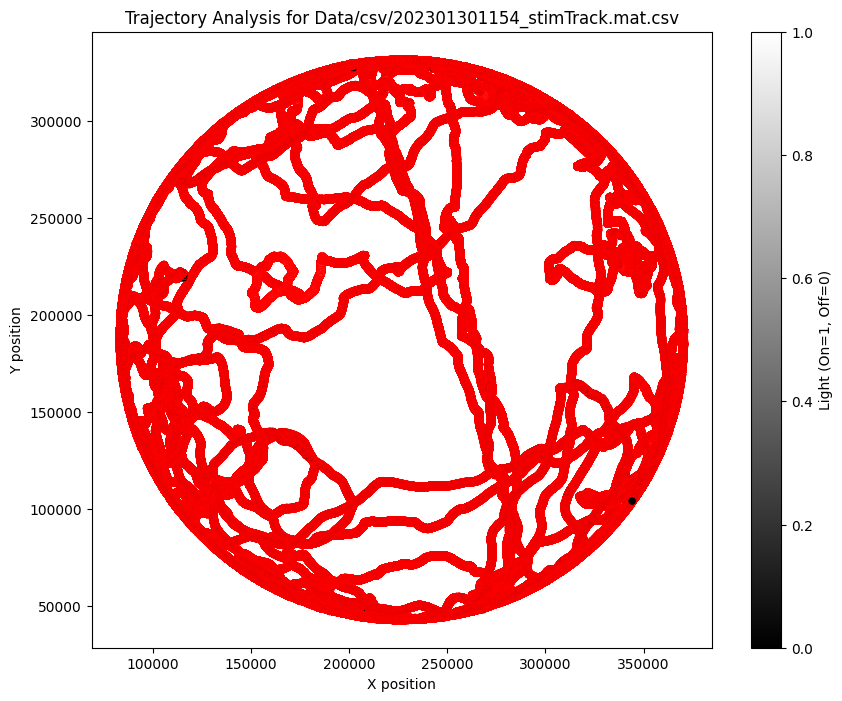

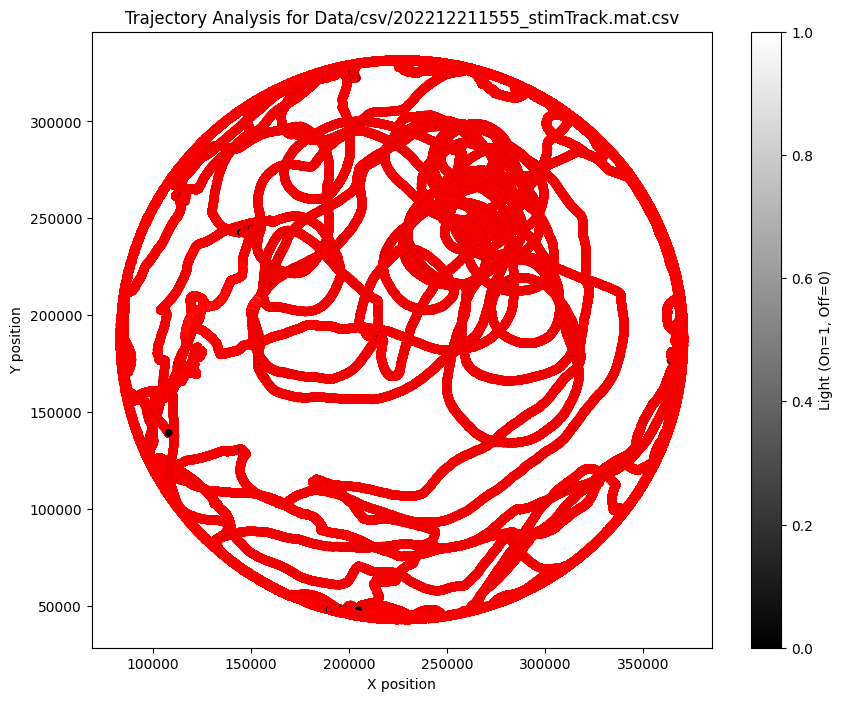

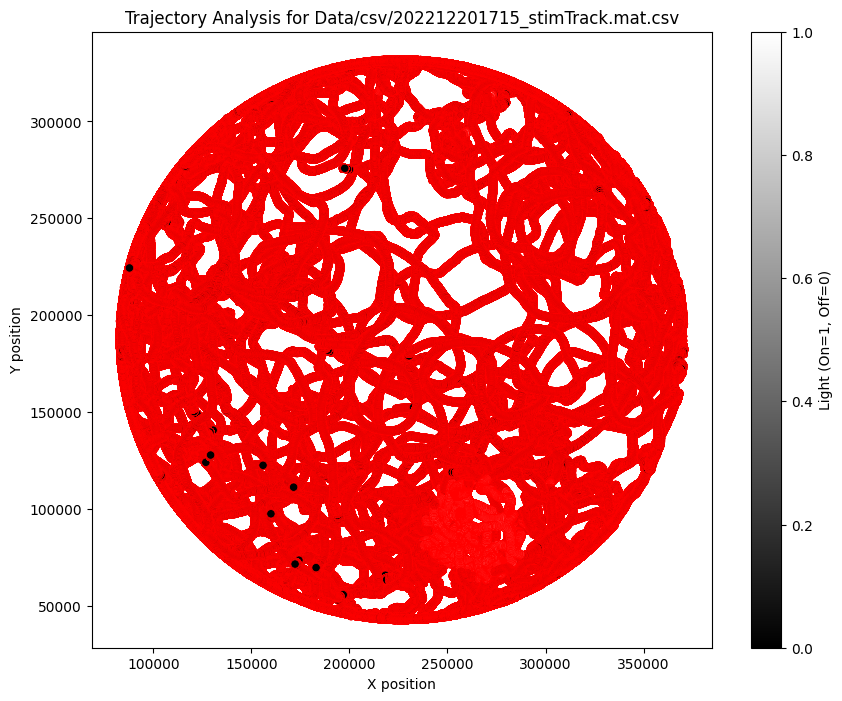

In [5]:
# Fetch all CSV files from the current directory
csv_files = glob.glob("Data/csv/*.csv")
    
for csv_file in csv_files:
    plot_trajectory(csv_file)

## Speed and Curvature Analysis
Objective: Determine speed, identify sharp turns, curved walks, and stops in the fly's trajectory.

Method:
 - Speed Calculation: Compute the speed as the change in distance over time using Euclidean distance between subsequent points.
 - Curvature Calculation: Use the kinematic formulae to compute the curvature of the path. Identify areas of the path with high curvature as sharp turns.
 - Segmentation: Classify segments of the trajectory as sharp turns, curved walks, or stops based on speed and curvature values.
 



In [7]:
def compute_speed(df):
    """Computes the speed based on Euclidean distance between subsequent points."""
    df['speed'] = np.sqrt(df['x'].diff()**2 + df['y'].diff()**2)
    return df

def compute_curvature(df):
    """Compute the curvature using three-point formula. Curvature is approximated using discrete points. Ref: https://math.stackexchange.com/questions/2610186/discrete-points-curvature-analysis"""
    x, y = df['x'].to_numpy(), df['y'].to_numpy()
    df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))
                            / np.sqrt((x[:-2] - x[1:-1])**2 + (y[:-2] - y[1:-1])**2) / np.sqrt((x[1:-1] - x[2:])**2 + (y[1:-1] - y[2:])**2), 0])
    return df

def classify_segments(df, speed_threshold=0.5, curvature_threshold=0.5):
    """Classifies segments based on speed and curvature."""
    conditions = [
        (df['speed'] < speed_threshold),
        (df['curvature'] > curvature_threshold),
        (df['curvature'] < -curvature_threshold),
        (df['speed'] >= speed_threshold) & ((df['curvature'] <= curvature_threshold) & (df['curvature'] >= -curvature_threshold))
    ]
    choices = ['stop', 'sharp turn', 'sharp turn', 'curved walk']
    df['segment'] = np.select(conditions, choices, default='walk')
    return df

def plot_analysis(df, title):
    """Plots the trajectory color-coded by segment type."""
    plt.figure(figsize=(12, 8))
    for segment, group in df.groupby('segment'):
        plt.scatter(group['x'], group['y'], label=segment)
    plt.title(title)
    plt.xlabel('X position')
    plt.ylabel('Y position')
    plt.legend()
    plt.show()

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


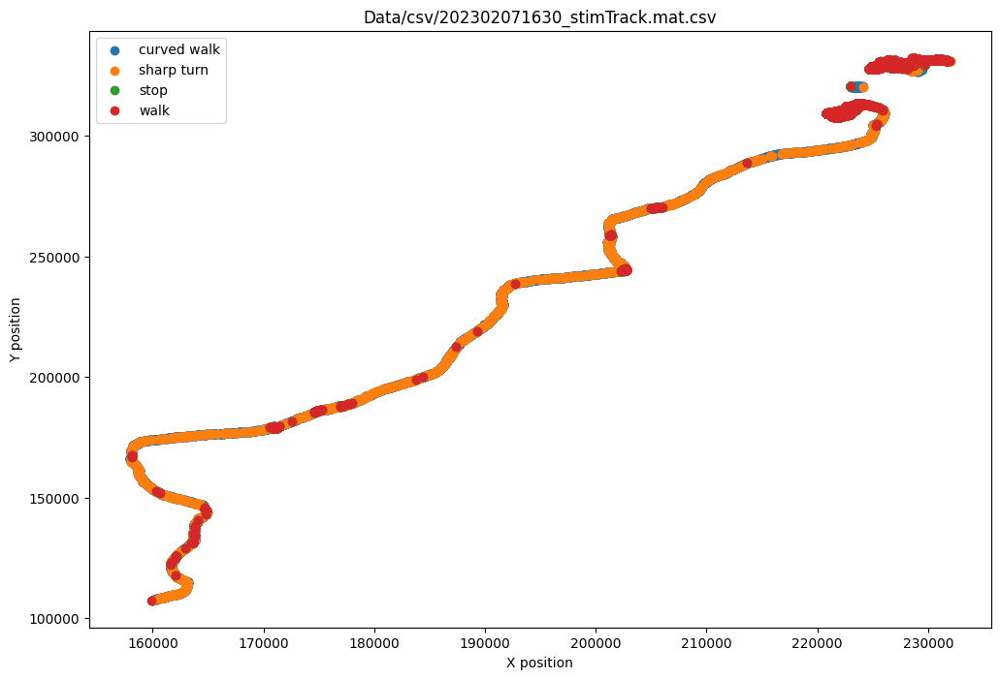

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


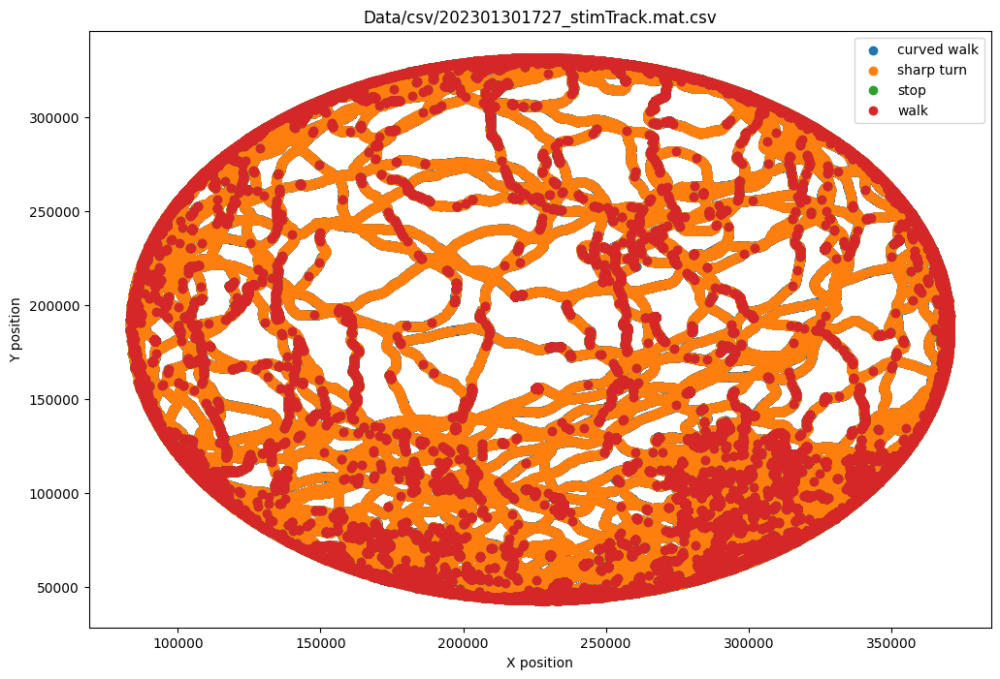

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


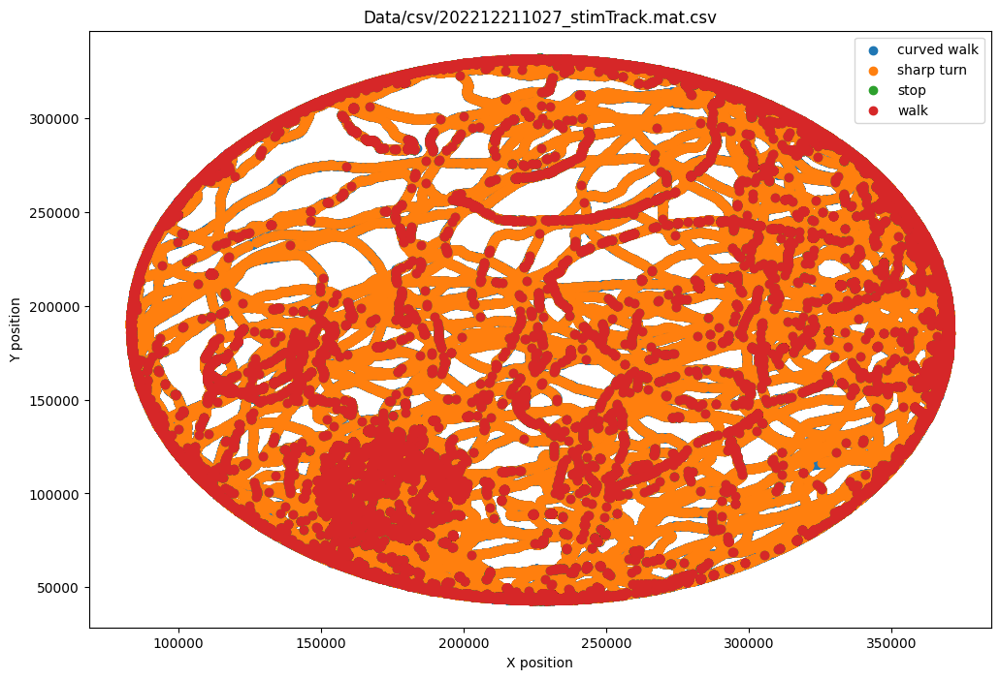

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


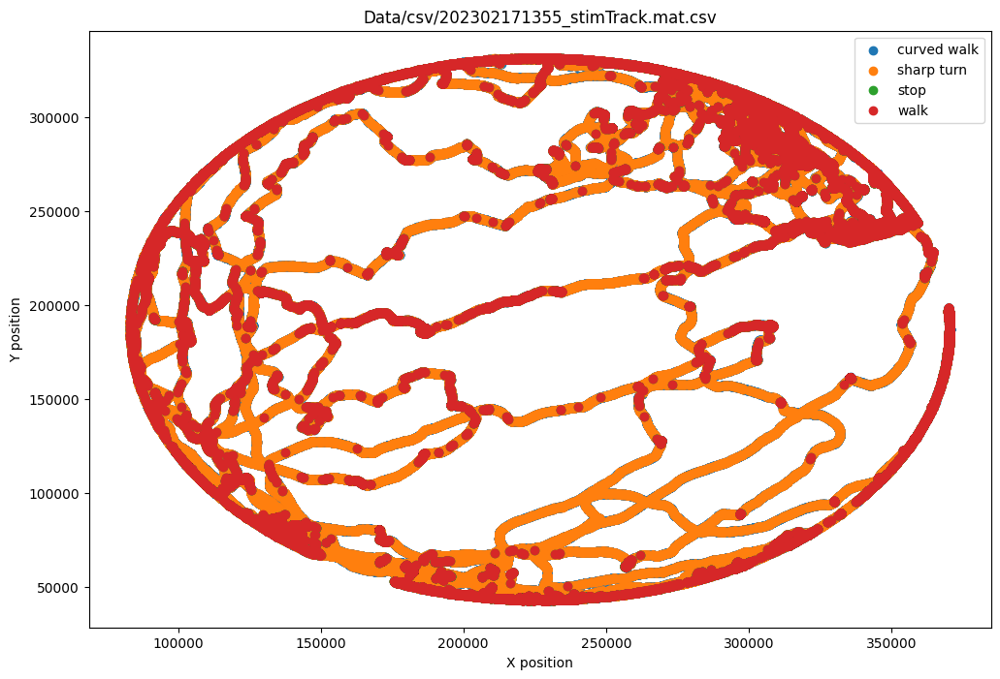

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


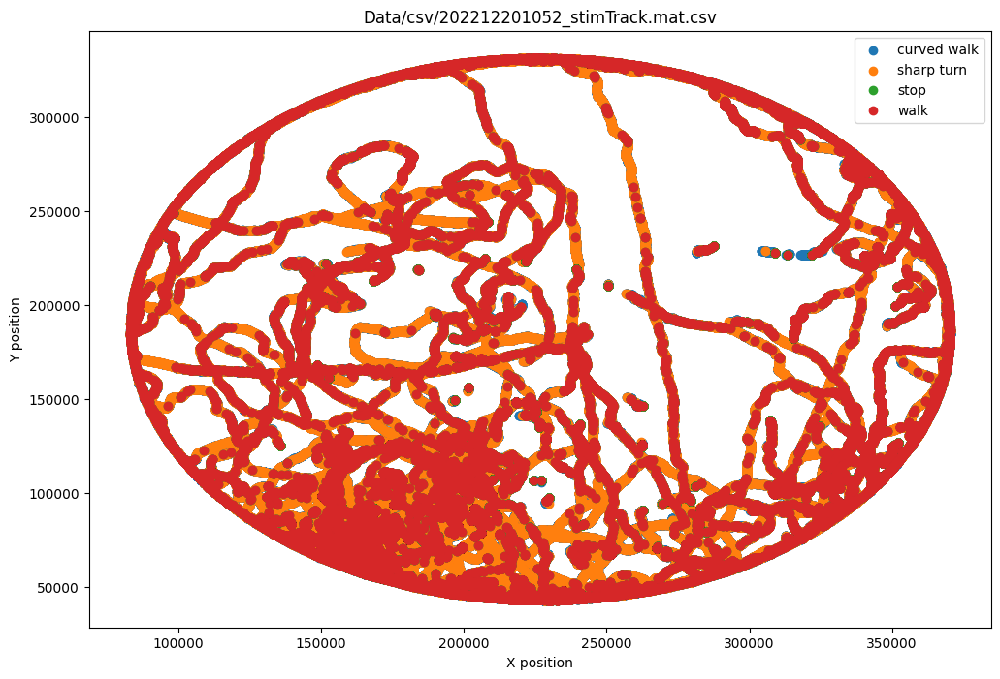

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


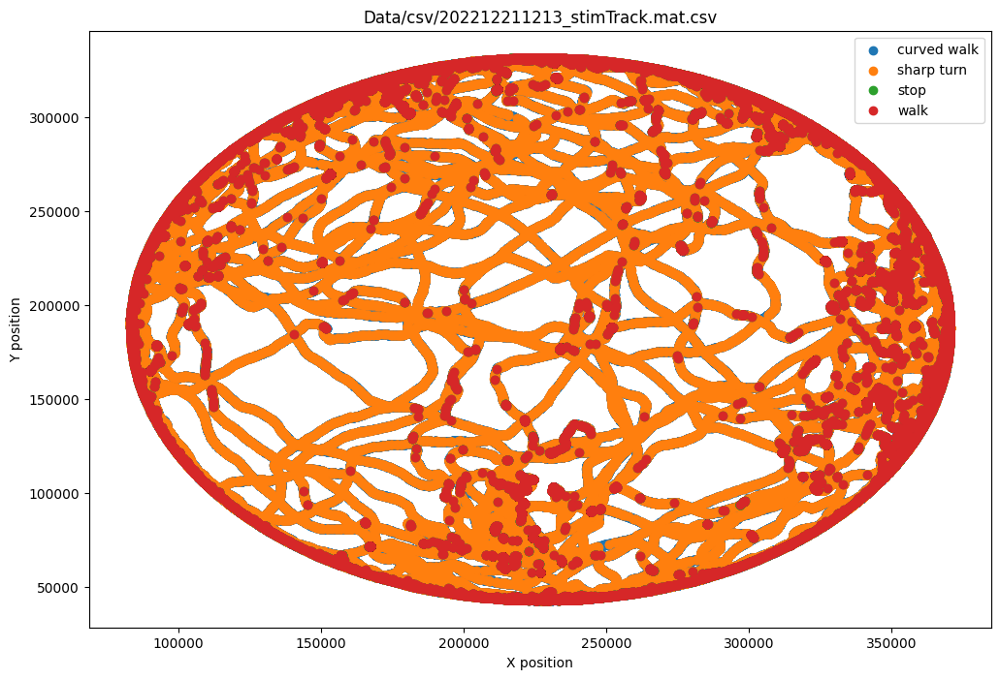

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


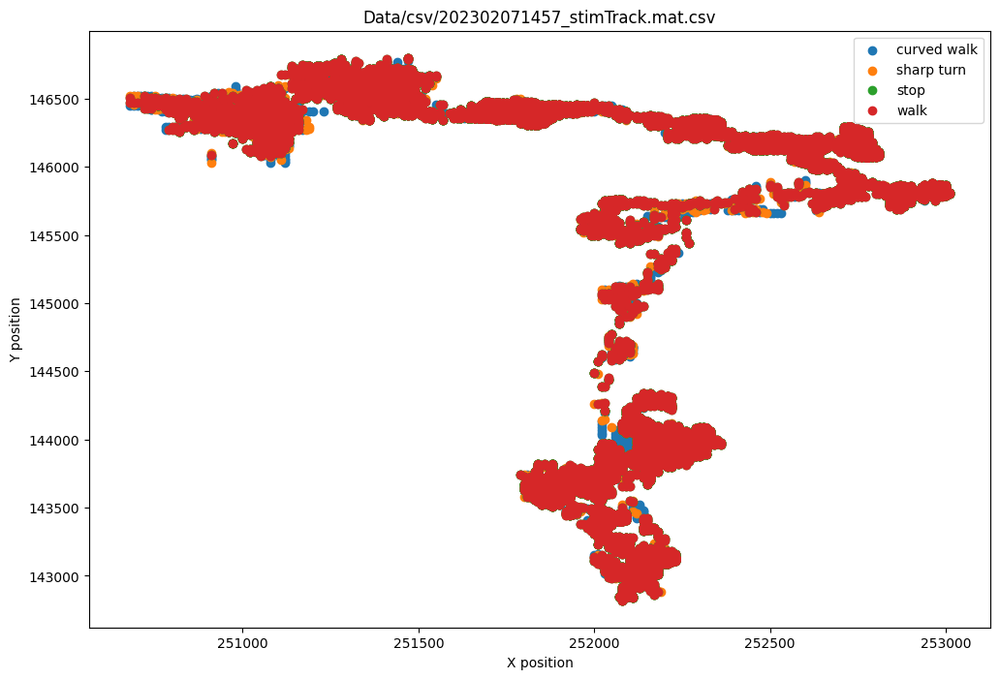

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


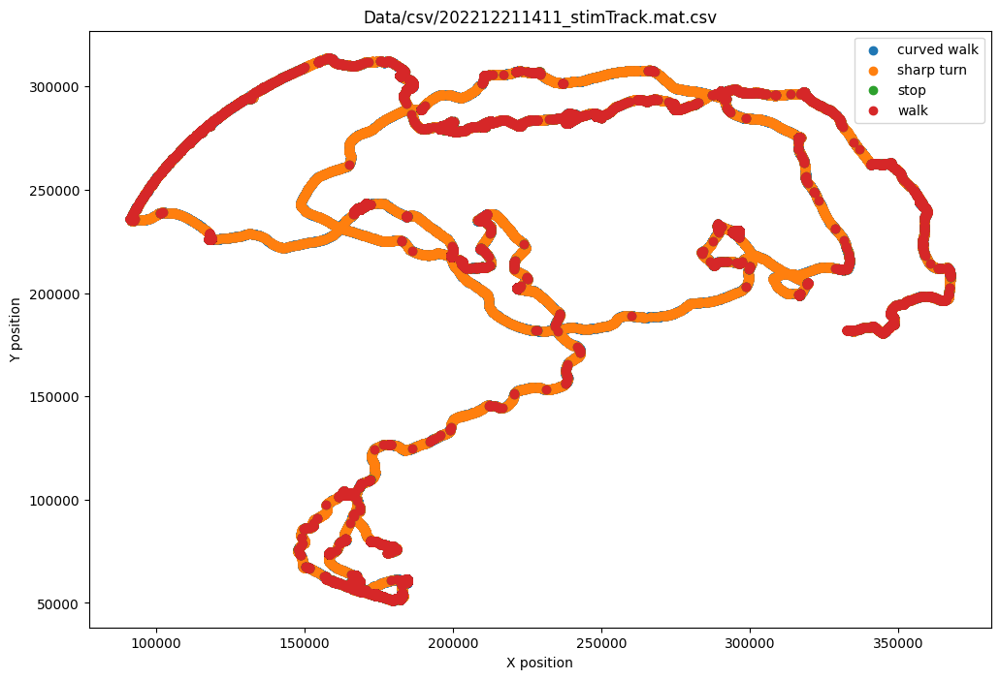

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


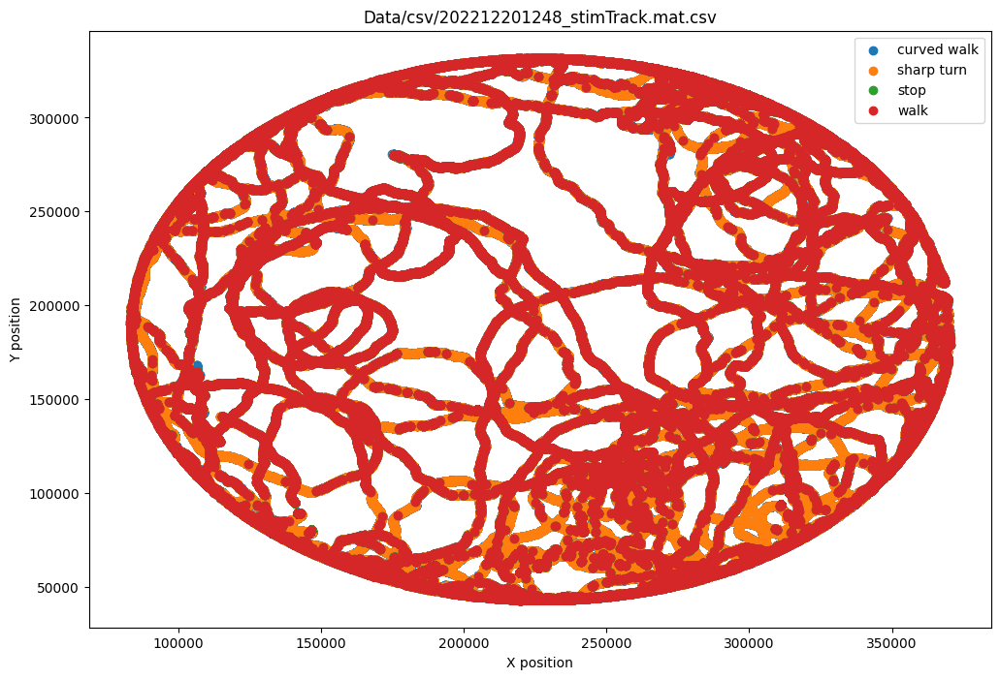

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


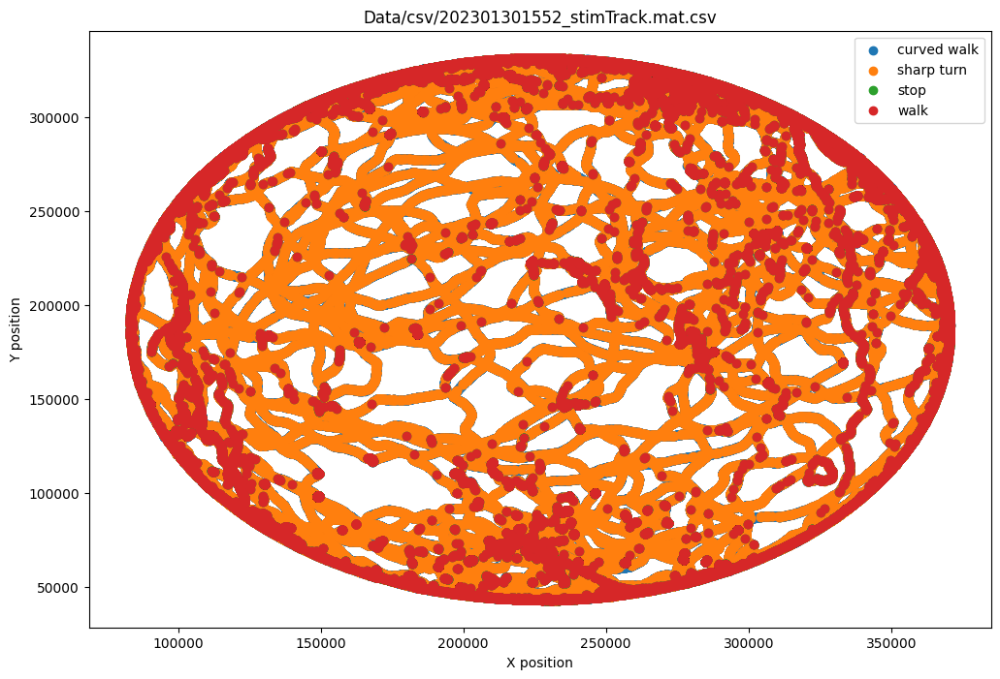

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


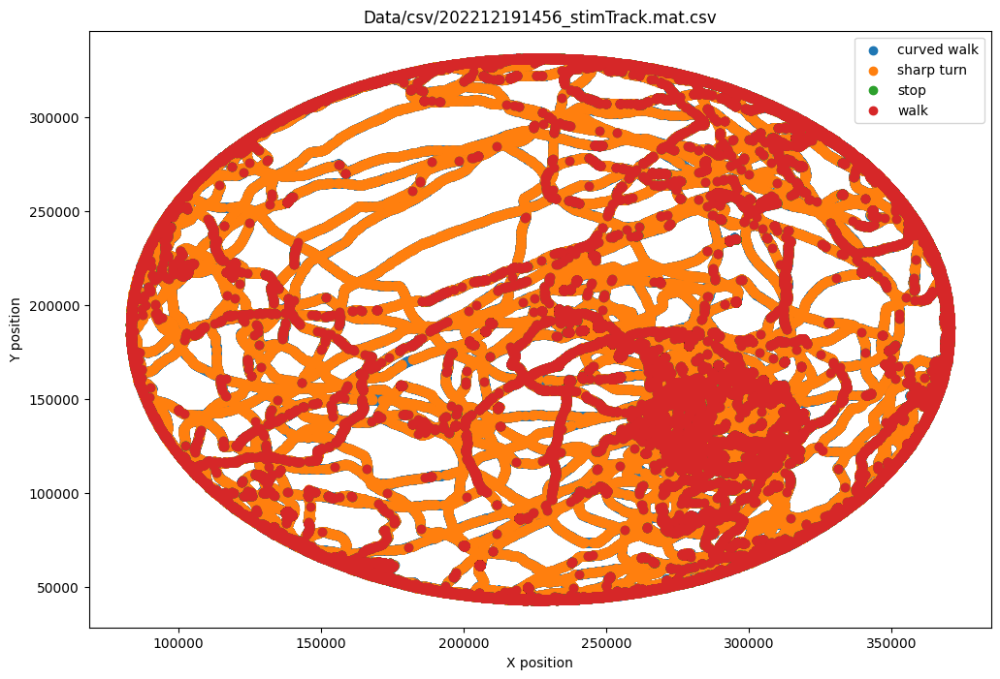

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


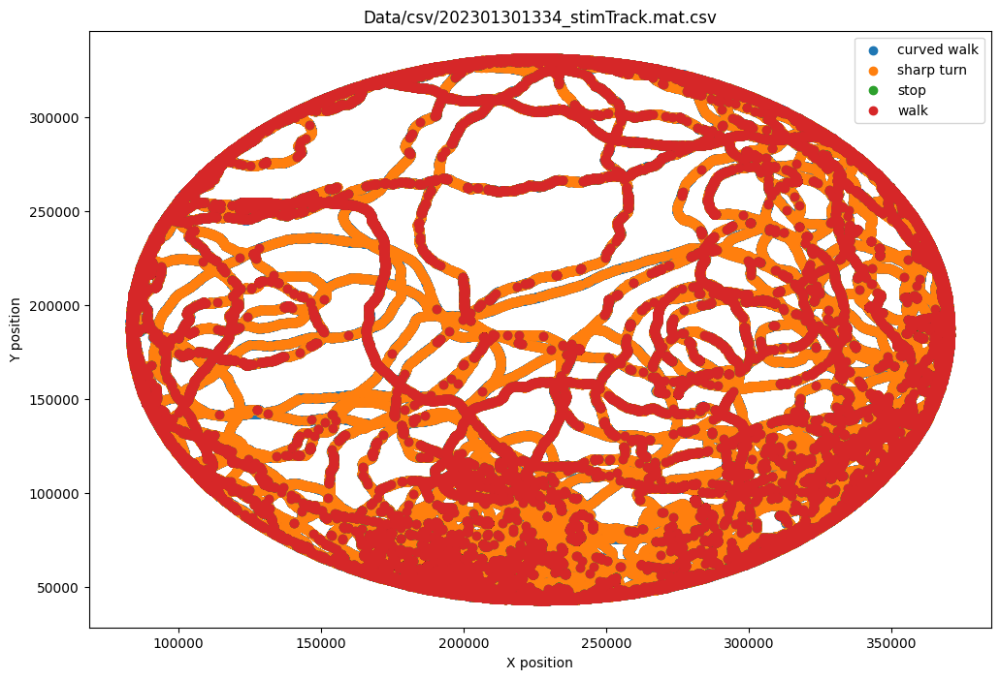

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


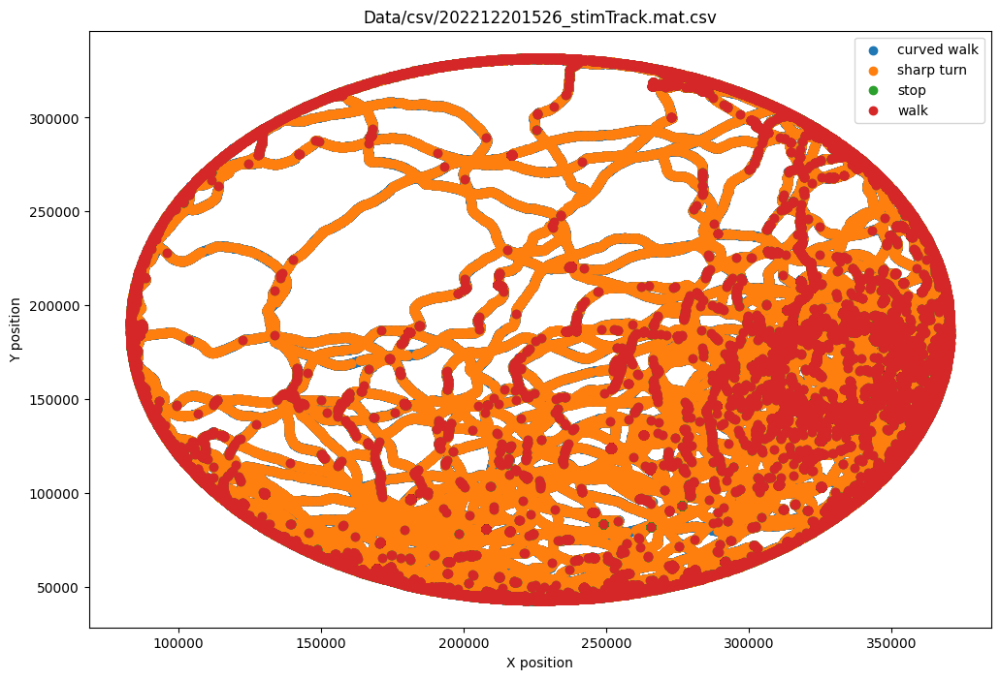

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


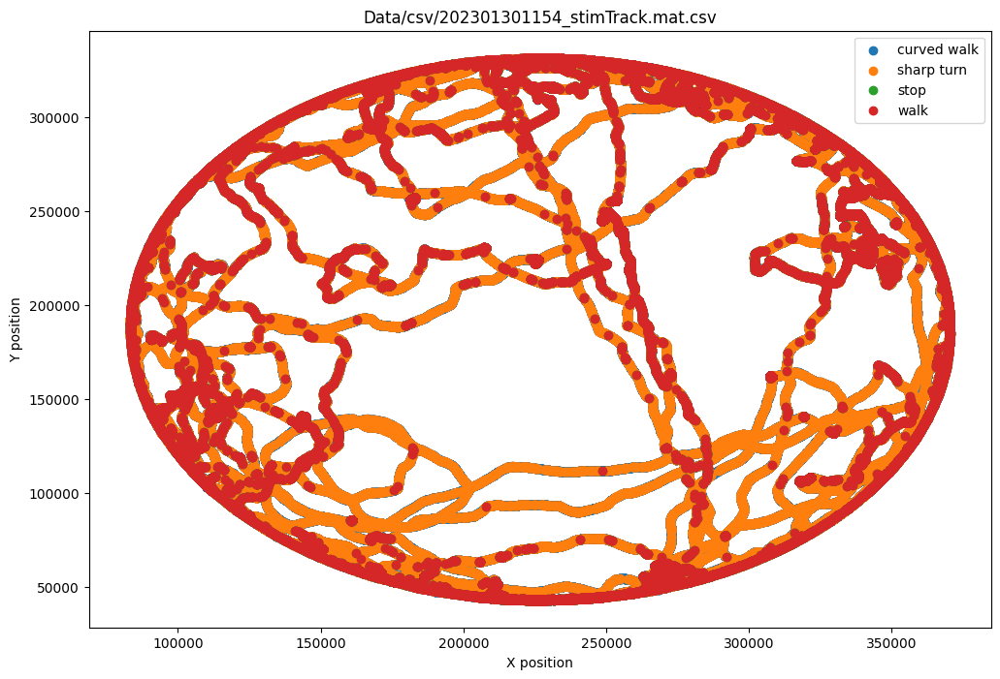

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


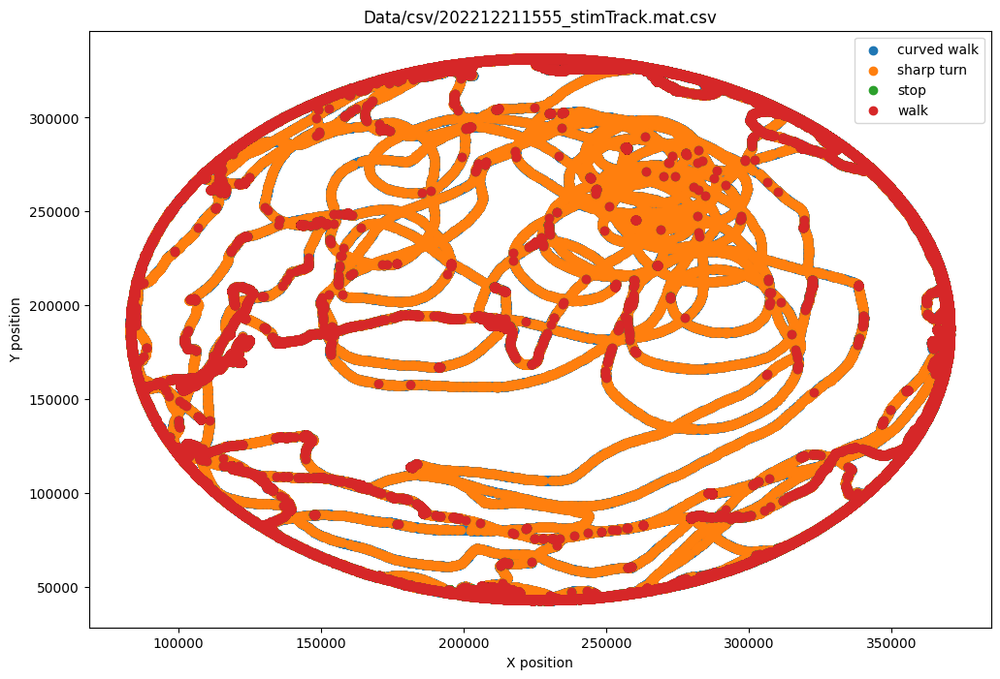

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


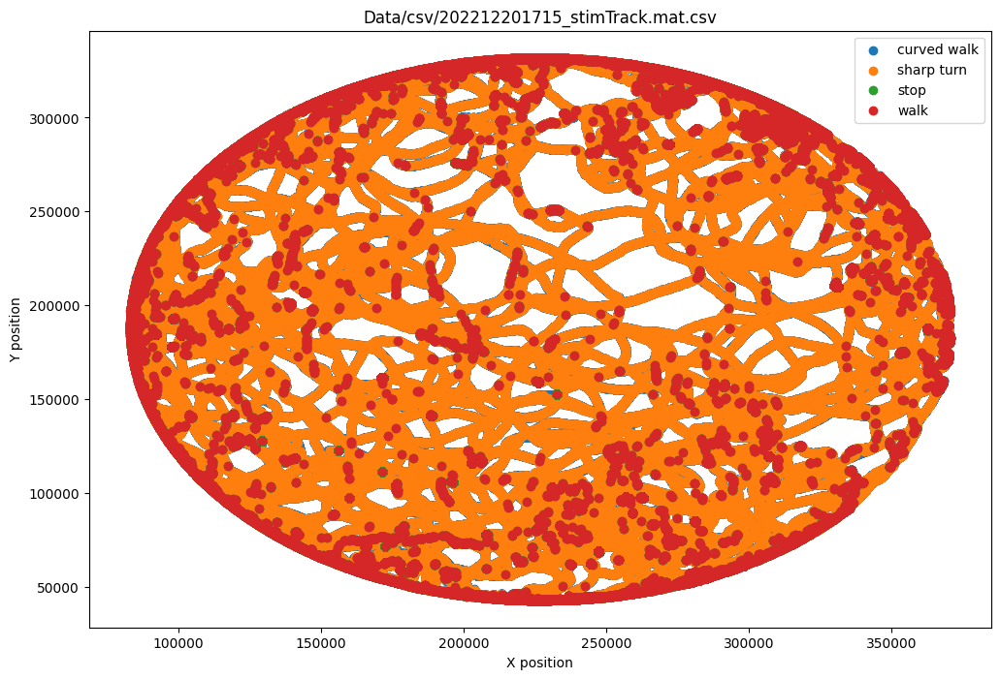

In [10]:
csv_files = glob.glob("Data/csv/*.csv")

for csv_file in csv_files:
    df = pd.read_csv(csv_file, names=['x', 'y', 'light'], header=None)
    if all(column in df.columns for column in ['x', 'y']):
        df = compute_speed(df)
        df = compute_curvature(df)
        df = classify_segments(df)
        plot_analysis(df, csv_file)
    else:
        print(f"Missing necessary columns in {csv_file}. Ensure 'x' and 'y' columns exist.")


This will provide visual comparisons of the fly's movement under different light conditions, as well as statistical tests to determine the significance of any observed differences.

## Light Influence Analysis
Objective: Examine how the presence or absence of light affects the fly's movement.

Method:

- Comparison: Compare the fly's trajectory, speed, and curvature when the light is on vs. when it is off.
- Statistical Analysis: Use statistical tests (like t-tests) to determine if differences in movement patterns are significant based on light conditions.


In [14]:
def compare_light_influence(df):
    """Compares trajectory, speed, and curvature based on light conditions."""
    light_on = df[df['light'] == 1]
    light_off = df[df['light'] == 0]
    
    fig, axs = plt.subplots(3, 1, figsize=(12, 18))

    # Trajectory
    axs[0].plot(light_on['x'], light_on['y'], label="Light On", color="yellow")
    axs[0].plot(light_off['x'], light_off['y'], label="Light Off", color="gray")
    axs[0].set_title("Trajectory")
    axs[0].legend()

    # Speed
    axs[1].plot(light_on['speed'], label="Light On", color="yellow")
    axs[1].plot(light_off['speed'], label="Light Off", color="gray")
    axs[1].set_title("Speed")
    axs[1].legend()

    # Curvature
    axs[2].plot(light_on['curvature'], label="Light On", color="yellow")
    axs[2].plot(light_off['curvature'], label="Light Off", color="gray")
    axs[2].set_title("Curvature")
    axs[2].legend()

    plt.tight_layout()
    plt.show()
    
    # Statistical Analysis (T-tests)
    t_speed, p_speed = ttest_ind(light_on['speed'].dropna(), light_off['speed'].dropna())
    t_curvature, p_curvature = ttest_ind(light_on['curvature'].dropna(), light_off['curvature'].dropna())

    print("T-test results for Speed: T-value =", t_speed, "P-value =", p_speed)
    print("T-test results for Curvature: T-value =", t_curvature, "P-value =", p_curvature)

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


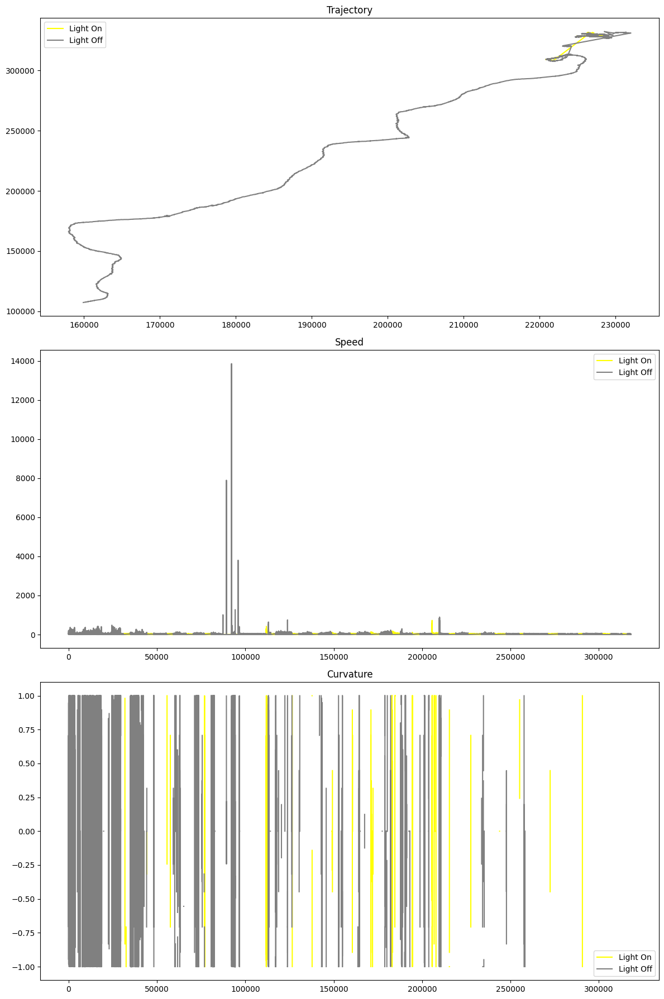

T-test results for Speed: T-value = -23.476943977397113 P-value = 8.914328670062694e-122
T-test results for Curvature: T-value = 1.4981695525561616 P-value = 0.1341086593854173


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


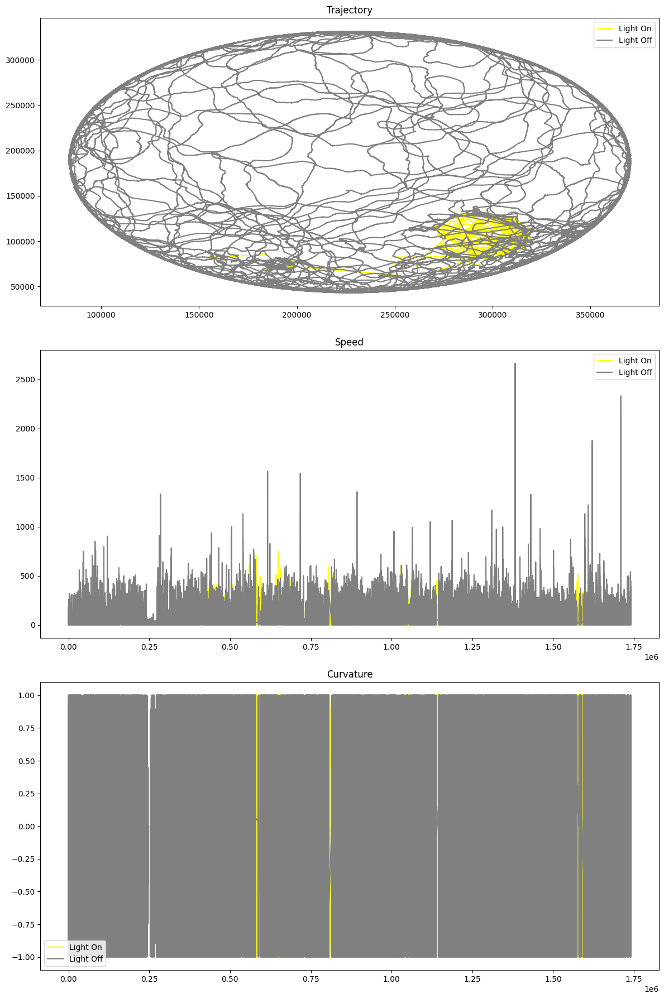

T-test results for Speed: T-value = 45.56011486810911 P-value = 0.0
T-test results for Curvature: T-value = -0.29190664001535016 P-value = 0.7703580505579171


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


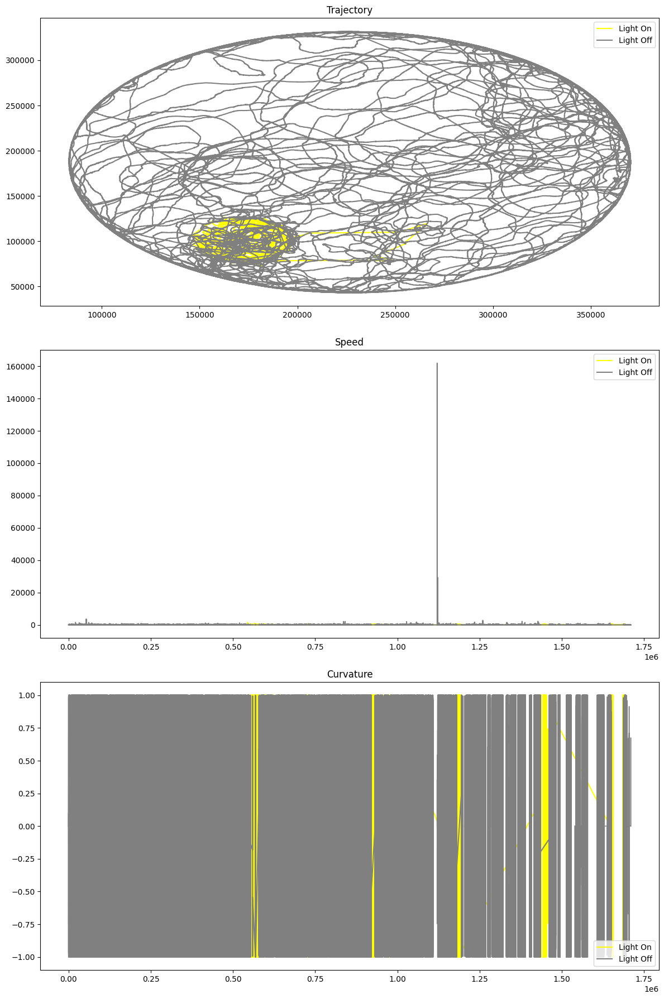

T-test results for Speed: T-value = -14.902984305618984 P-value = 3.1748261632090285e-50
T-test results for Curvature: T-value = -0.8816316839377261 P-value = 0.3779761805283087


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


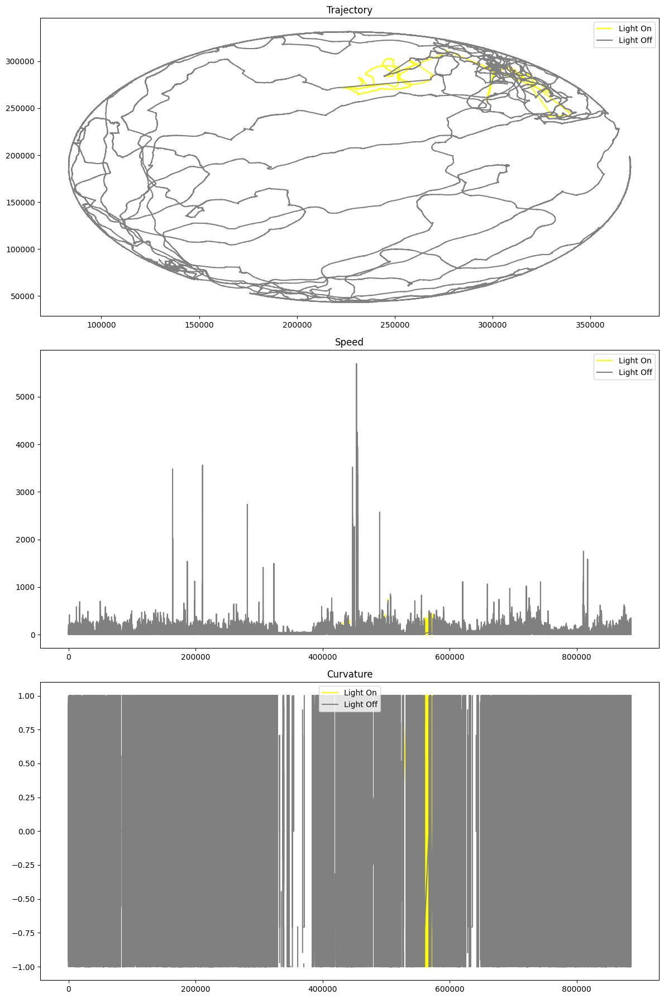

T-test results for Speed: T-value = 43.68136790138859 P-value = 0.0
T-test results for Curvature: T-value = -0.531864581523107 P-value = 0.5948200121257864


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


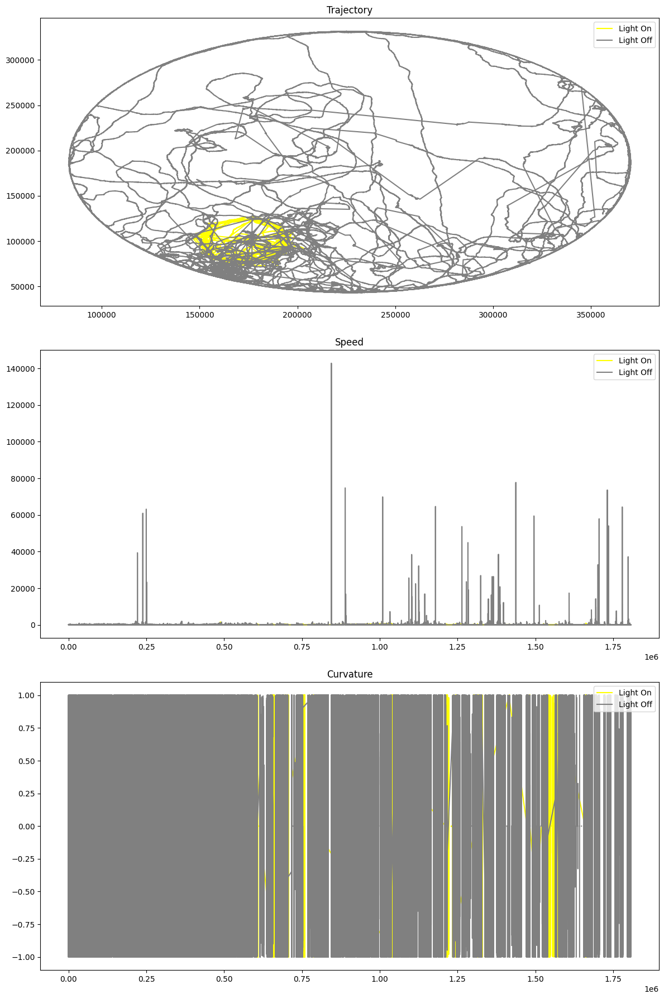

T-test results for Speed: T-value = -5.3137998209829425 P-value = 1.0737522786665358e-07
T-test results for Curvature: T-value = 0.3010075261215886 P-value = 0.7634088168419625


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


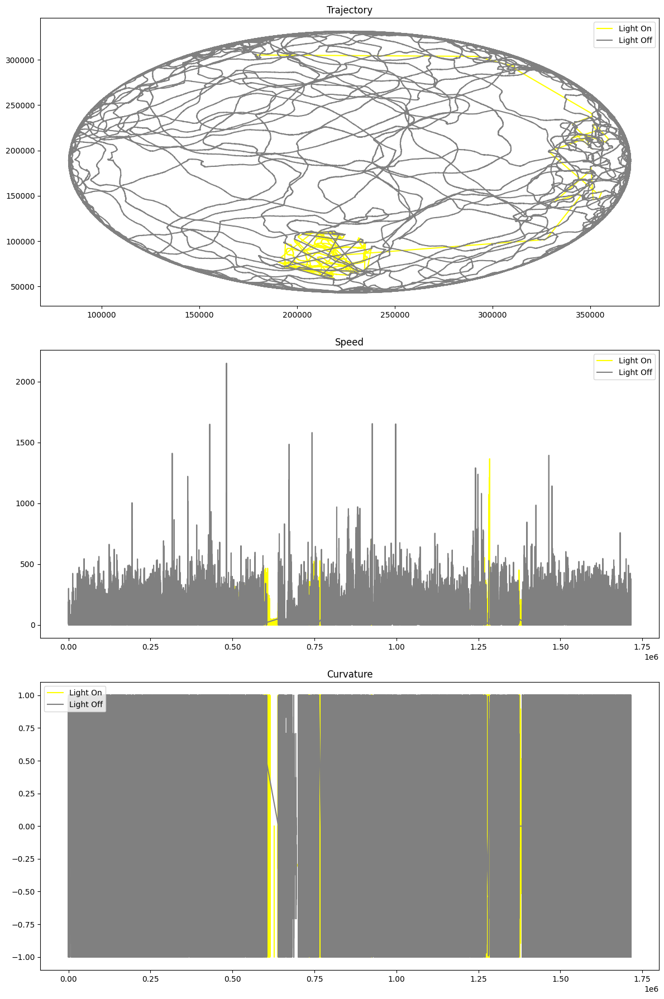

T-test results for Speed: T-value = -106.07603657116108 P-value = 0.0
T-test results for Curvature: T-value = -0.5458525993670852 P-value = 0.5851673526456955


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


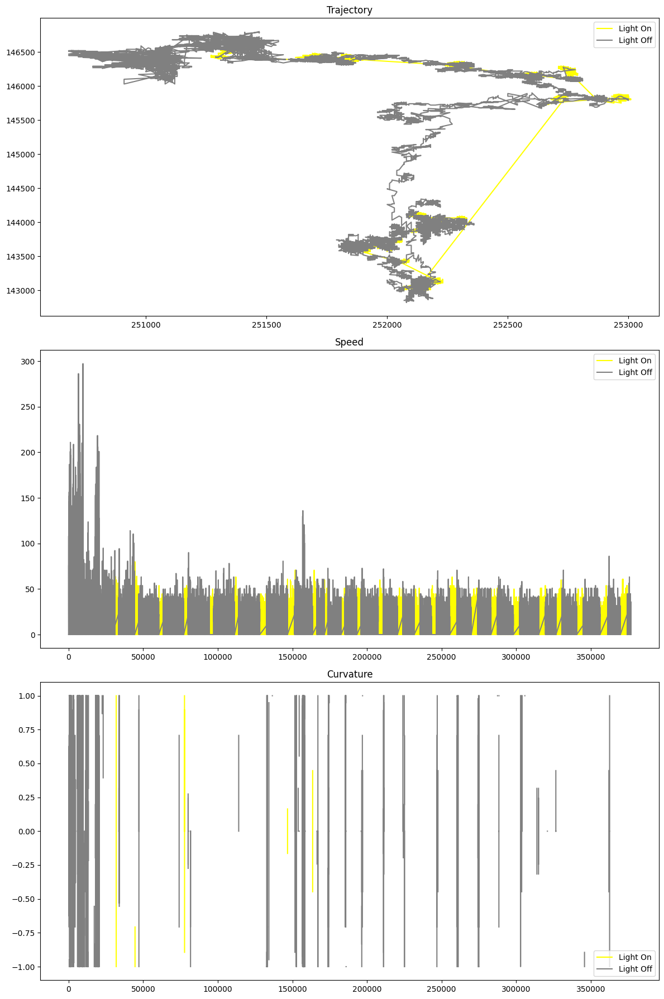

T-test results for Speed: T-value = -17.908841193005674 P-value = 1.0775466066708908e-71
T-test results for Curvature: T-value = 0.7442885059320795 P-value = 0.45676180298309355


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


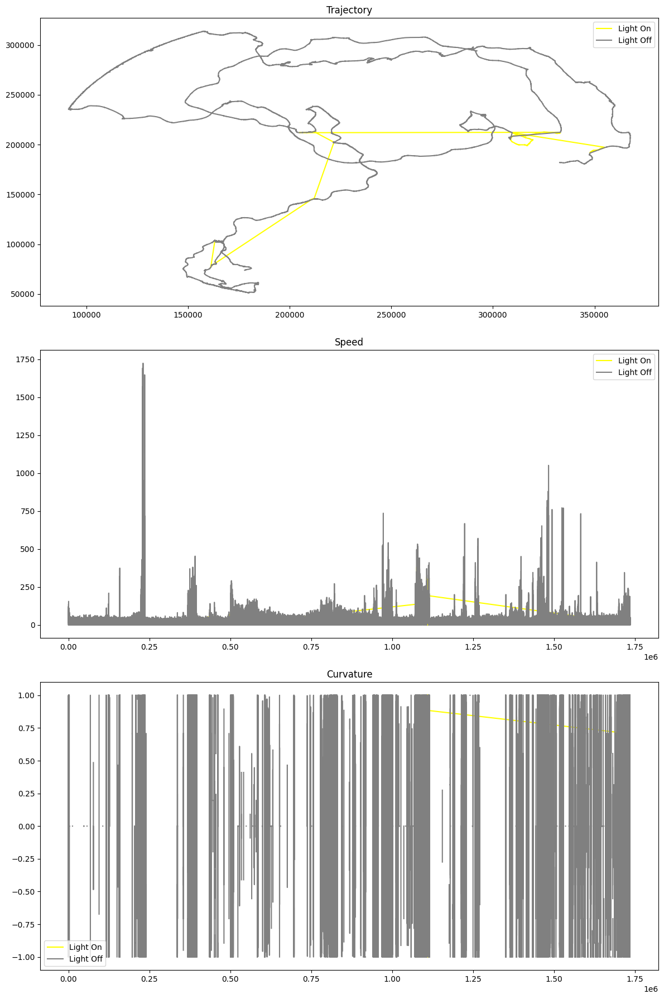

T-test results for Speed: T-value = 68.67772556658534 P-value = 0.0
T-test results for Curvature: T-value = -0.6906289290255494 P-value = 0.48980008709058753


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


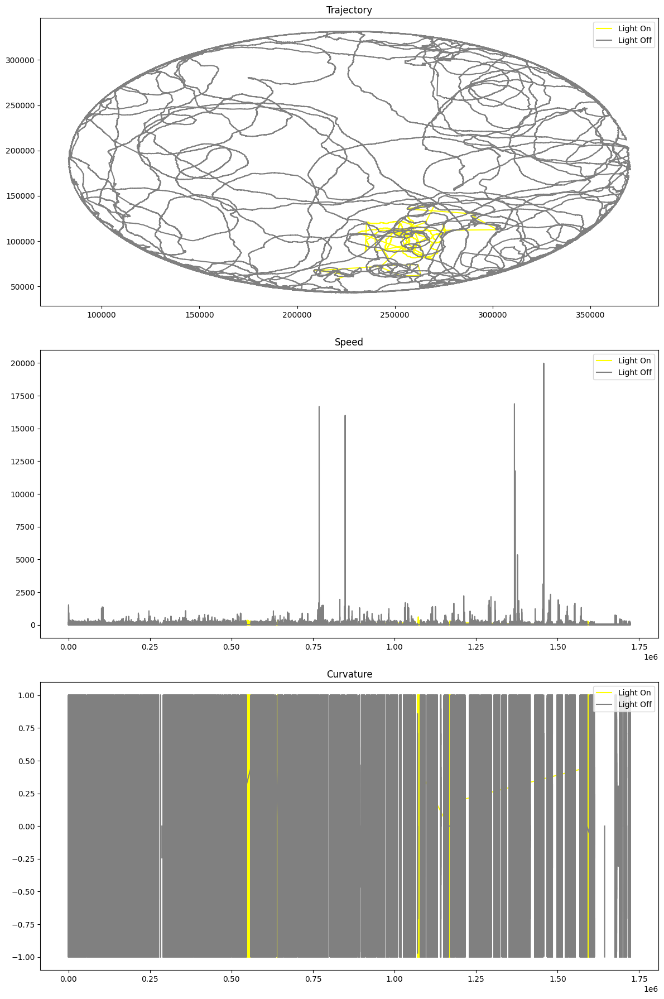

T-test results for Speed: T-value = 5.912247113459631 P-value = 3.3753494804481475e-09
T-test results for Curvature: T-value = -0.0017602953951792568 P-value = 0.9985954885433166


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


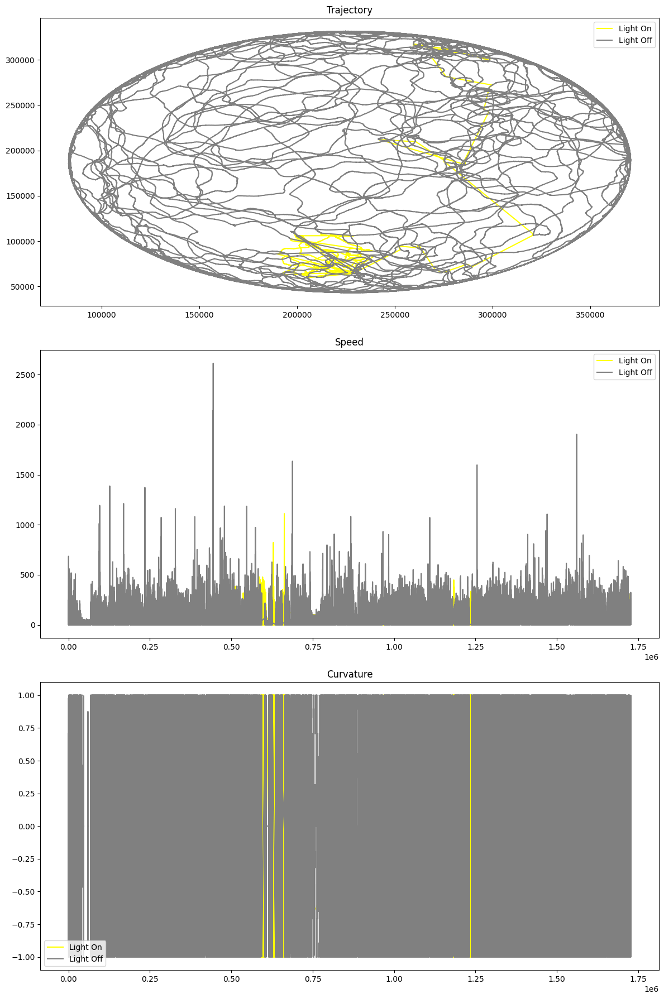

T-test results for Speed: T-value = -7.439676541130328 P-value = 1.0097850368607364e-13
T-test results for Curvature: T-value = -0.24834061686561482 P-value = 0.8038709152770462


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


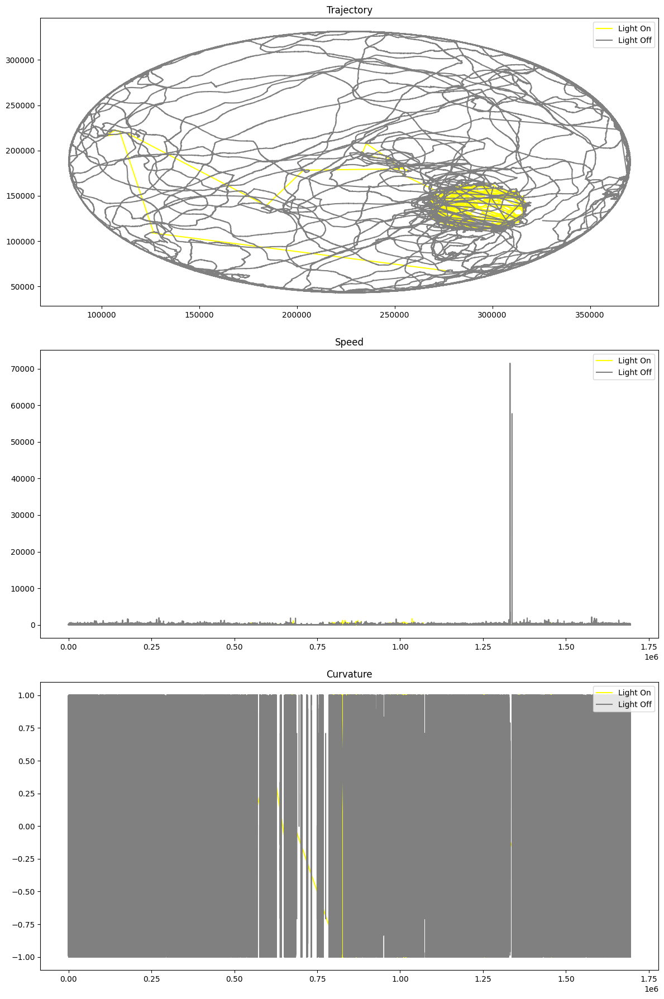

T-test results for Speed: T-value = 34.63588872691239 P-value = 9.011961579696331e-263
T-test results for Curvature: T-value = -0.39847954377415334 P-value = 0.6902768073168508


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


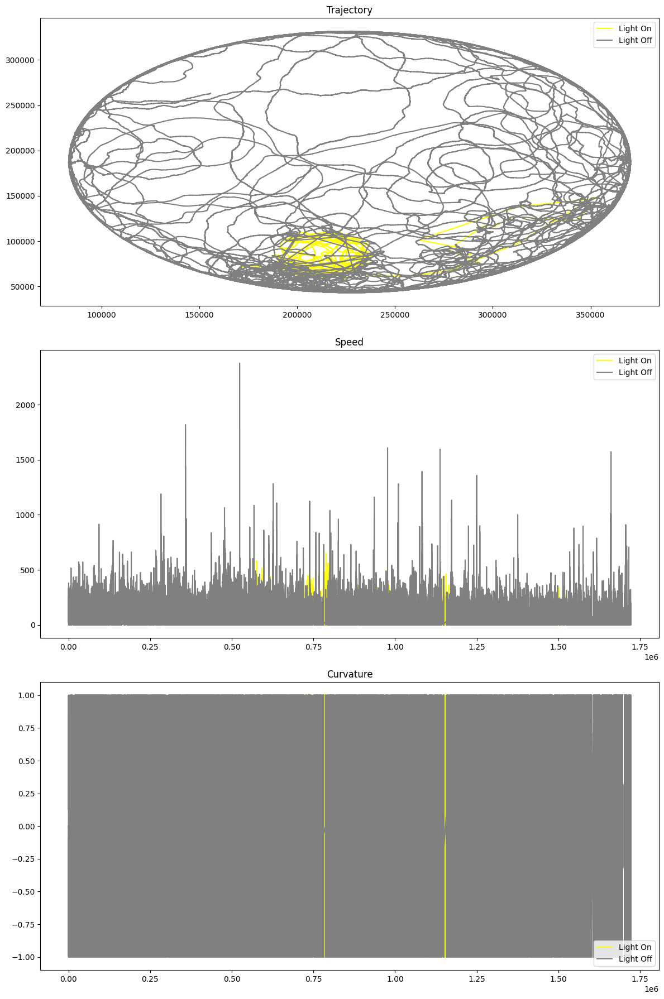

T-test results for Speed: T-value = 40.12256636249768 P-value = 0.0
T-test results for Curvature: T-value = -0.3969107905911514 P-value = 0.6914333075430668


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


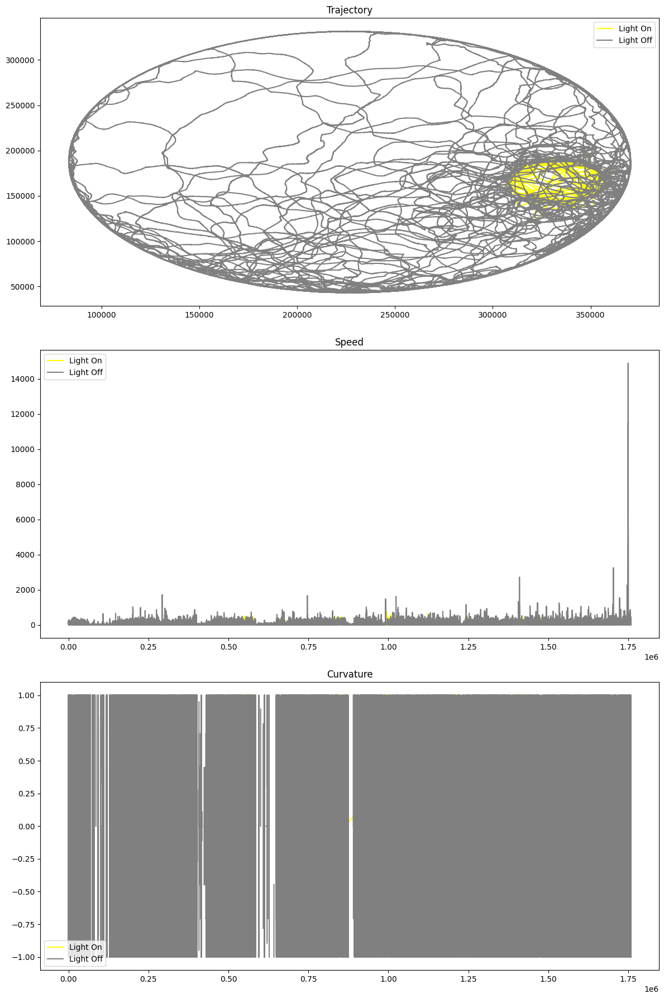

T-test results for Speed: T-value = 41.95993020467516 P-value = 0.0
T-test results for Curvature: T-value = -1.4345581515089472 P-value = 0.15141329927934266


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


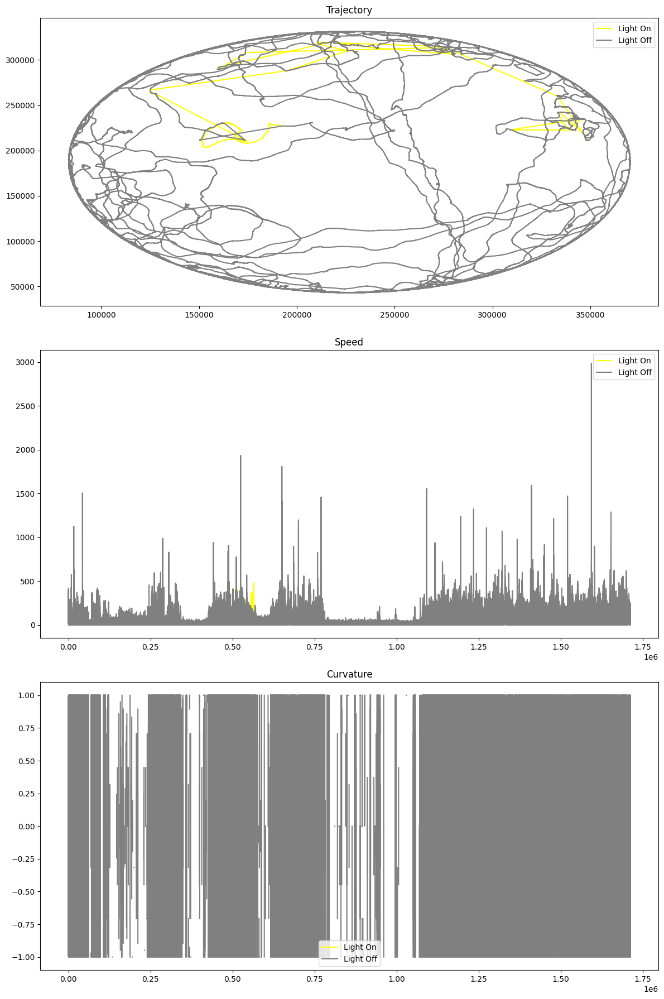

T-test results for Speed: T-value = 34.0437215154835 P-value = 6.118052011863854e-254
T-test results for Curvature: T-value = 0.5801117797559968 P-value = 0.5618393992580892


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


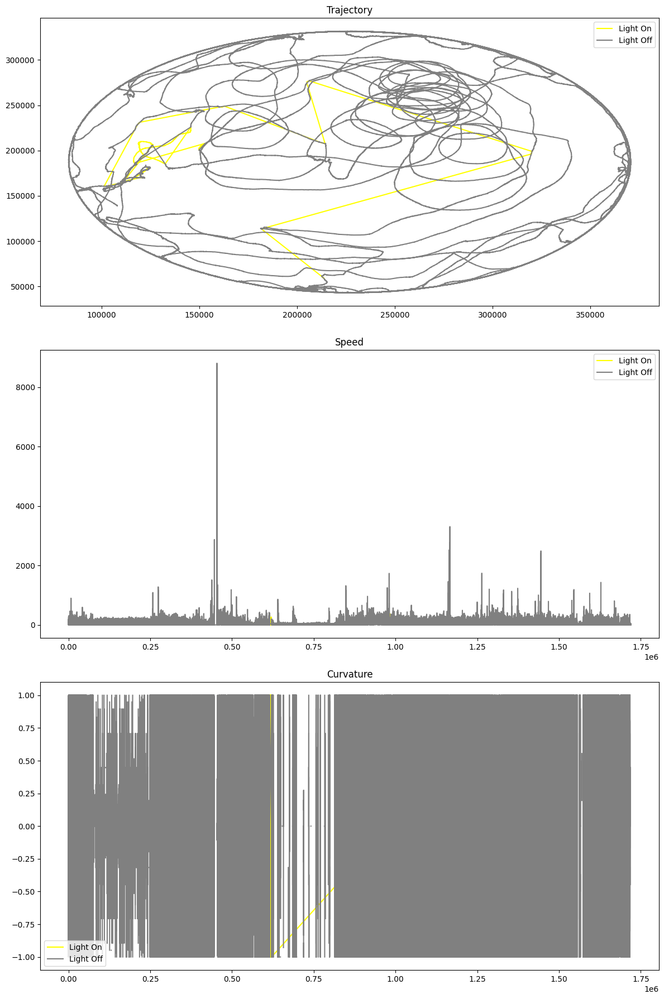

T-test results for Speed: T-value = 16.74554384259477 P-value = 6.173675770568495e-63
T-test results for Curvature: T-value = 0.4017914248702126 P-value = 0.6878376525302476


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


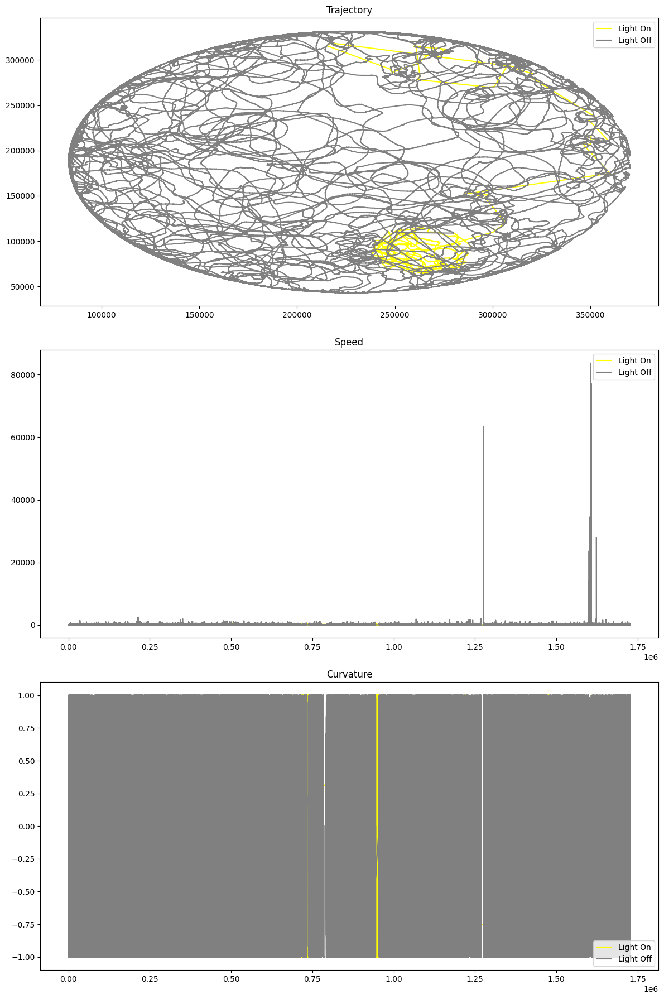

T-test results for Speed: T-value = 6.0348384950188985 P-value = 1.5915395094305262e-09
T-test results for Curvature: T-value = -0.5513742545712854 P-value = 0.5813772428874022


In [15]:
csv_files = glob.glob("Data/csv/*.csv")
for csv_file in csv_files:
    df = pd.read_csv(csv_file, names=['x', 'y', 'light'], header=None)
    if all(column in df.columns for column in ['x', 'y', 'light']):
        df = compute_speed(df)
        df = compute_curvature(df)
        compare_light_influence(df)
    else:
        print(f"Missing necessary columns in {csv_file}. Ensure 'x', 'y', and 'light' columns exist.")


## State Analysis
Objective: Segment the fly's trajectory into various behavioral states.

Method:

 - Boundary Analysis: Identify when the fly is near the edge of the arena.
 - State Classification: Based on speed, curvature, and boundary proximity, classify each segment of the trajectory as a boundary, walk, sharp turn, or stop.


In [22]:
def boundary_analysis(df, boundary_thresh):
    """Identify when the fly is near the edge of the arena."""
    # Assuming the arena is a square from (0,0) to (max_x, max_y)
    max_x, max_y = df['x'].max(), df['y'].max()
    df['near_boundary'] = ((df['x'] < boundary_thresh) | 
                           (df['x'] > max_x - boundary_thresh) | 
                           (df['y'] < boundary_thresh) | 
                           (df['y'] > max_y - boundary_thresh))
    return df

def classify_state(df, speed_thresh, curvature_thresh):
    """Classify trajectory segments based on speed, curvature, and boundary proximity."""
    conditions = [
        (df['near_boundary']),
        (df['speed'] < speed_thresh),
        (df['curvature'] > curvature_thresh),
        (df['speed'] > speed_thresh) & (df['curvature'] <= curvature_thresh)
    ]
    choices = ['boundary', 'stop', 'sharp turn', 'walk']
    df['state'] = np.select(conditions, choices, default='unclassified')
    return df

def process_csv(file_name, boundary_thresh=10, speed_thresh=1, curvature_thresh=1):
    """Process individual CSV file."""
    df = pd.read_csv(file_name, names=['x', 'y', 'light'], header=None)
    df = compute_speed(df)
    df = compute_curvature(df)
    df = boundary_analysis(df, boundary_thresh)
    df = classify_state(df, speed_thresh, curvature_thresh)
    return df

# Iterate over all CSV files and process them
all_files = glob.glob("Data/csv/*.csv")
for file in all_files:
    processed_df = process_csv(file)
    os.makedirs("Data/processed", exist_ok=True)
    output_file = f"Data/processed/processed_{Path(file).stem}.csv"
    processed_df.to_csv(output_file, index=False)
    print(f"Processed {file} and saved as {output_file}")

/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202302071630_stimTrack.mat.csv and saved as Data/processed/processed_202302071630_stimTrack.mat.csv


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202301301727_stimTrack.mat.csv and saved as Data/processed/processed_202301301727_stimTrack.mat.csv


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202212211027_stimTrack.mat.csv and saved as Data/processed/processed_202212211027_stimTrack.mat.csv


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202302171355_stimTrack.mat.csv and saved as Data/processed/processed_202302171355_stimTrack.mat.csv


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202212201052_stimTrack.mat.csv and saved as Data/processed/processed_202212201052_stimTrack.mat.csv


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202212211213_stimTrack.mat.csv and saved as Data/processed/processed_202212211213_stimTrack.mat.csv


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202302071457_stimTrack.mat.csv and saved as Data/processed/processed_202302071457_stimTrack.mat.csv


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202212211411_stimTrack.mat.csv and saved as Data/processed/processed_202212211411_stimTrack.mat.csv


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202212201248_stimTrack.mat.csv and saved as Data/processed/processed_202212201248_stimTrack.mat.csv


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202301301552_stimTrack.mat.csv and saved as Data/processed/processed_202301301552_stimTrack.mat.csv


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202212191456_stimTrack.mat.csv and saved as Data/processed/processed_202212191456_stimTrack.mat.csv


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202301301334_stimTrack.mat.csv and saved as Data/processed/processed_202301301334_stimTrack.mat.csv


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202212201526_stimTrack.mat.csv and saved as Data/processed/processed_202212201526_stimTrack.mat.csv


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202301301154_stimTrack.mat.csv and saved as Data/processed/processed_202301301154_stimTrack.mat.csv


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202212211555_stimTrack.mat.csv and saved as Data/processed/processed_202212211555_stimTrack.mat.csv


/var/folders/97/kd_d3ry10c9fwj1ddxl3j2mh0000gp/T/ipykernel_53648/507704991.py:9: RuntimeWarning: invalid value encountered in divide
  df['curvature'] = np.hstack([0, (x[:-2] * (y[1:-1] - y[2:]) + x[1:-1] * (y[2:] - y[:-2]) + x[2:] * (y[:-2] - y[1:-1]))


Processed Data/csv/202212201715_stimTrack.mat.csv and saved as Data/processed/processed_202212201715_stimTrack.mat.csv


## Distribution Analysis
---

In the context of studying fly behavior under varying lighting conditions, we can further analyze the fly's movement characteristics in three specific situations:

1. Just before the light is activated (pre-light condition).
2. During the active illumination (light is ON).
3. Just after the light is turned off (post-light condition).

The primary aim of this analysis is to discern if the introduction or removal of light influences the fly's motion patterns, and if so, to quantify this behavior shift. Our dataset captures the fly's position (X, Y coordinates), its instantaneous velocity, curvature of its trajectory, and the binary light condition (ON/OFF).

For an in-depth analysis:

1. We leverage the velocity data to understand the fly's movement speed across various conditions.
2. The curvature data is utilized to detect specific movement patterns like sharp turns or curved paths or stop, which can be indicative of the fly's reactions to its environment or possible navigational strategies.

Moreover, by overlaying a Gaussian distribution curve on the visualization, we can distinctly highlight the deviations (if any) from the fly's regular behavior when subjected to light changes. This Gaussian representation serves as a benchmark for "normal behavior," enabling easy identification of anomalies or shifts in behavior.

In sum, below analysis provides a comprehensive, visual, and quantitative mechanism to understand the impact of light on the fly's movement trajectory, ensuring a holistic view of its behavioral dynamics under varied conditions.

In [14]:
def load_datasets(path):
    #files = [os.path.join(directory, file) for file in os.listdir(directory) if file.endswith('.csv')]
    files = glob.glob(path)
    datasets = [pd.read_csv(file) for file in files]
    return datasets

In [15]:
def plot_trajectory(data):
    fig, ax = plt.subplots()
    
    # Segregate data based on light condition
    pre_light = data[data['Light On/ff'].shift(-1) == 1]  # Just before light ON
    light_on = data[data['Light On/ff'] == 1]             # Light is ON
    post_light = data[data['Light On/ff'].shift(1) == 1]  # Just after light OFF
    
    # Plotting
    ax.plot(pre_light['X'], pre_light['Y'], color='blue', label='Pre-Light')
    ax.plot(light_on['X'], light_on['Y'], color='yellow', label='Light ON')
    ax.plot(post_light['X'], post_light['Y'], color='green', label='Post-Light')
    
    # Overlay Gaussian distribution based on curvature
    for segment, color in zip([pre_light, light_on, post_light], ['blue', 'yellow', 'green']):
        mu, std = norm.fit(segment['curvature'])
        xmin, xmax = plt.xlim()
        x = np.linspace(xmin, xmax, 100)
        p = norm.pdf(x, mu, std)
        ax.plot(x, p, color=color, linestyle='dashed')
    
    ax.set_title('Fly Movement Trajectory')
    ax.set_xlabel('X Coordinate')
    ax.set_ylabel('Y Coordinate')
    ax.legend()
    plt.show()

KeyError: 'Light On/ff'

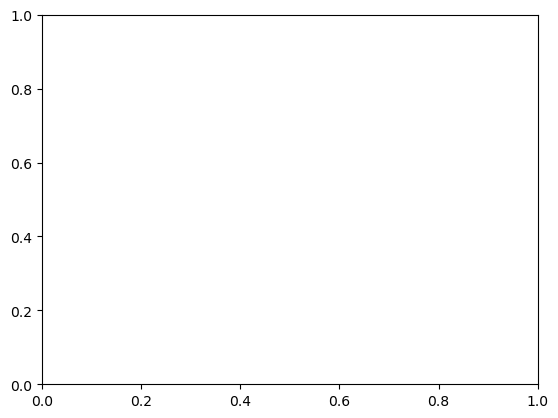

In [17]:
def main():
    path = '../Data/processed/*.csv'  # Set your directory path here

    datasets = load_datasets(path=path)
    
    for data in datasets:
        plot_trajectory(data)

main()